In [502]:
import sys
import matplotlib.pyplot as plt
import vaex
import os
import numpy as np
import pandas as pd
from helpers import *
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.distributions.empirical_distribution import ECDF

In [173]:
current_dir  = os.getcwd()
#We assume that the data for the specific ticker is already cleaned, here is a list of cleaned tickers
ticker_list = ["MSFT.OQ-2010" , "DOW.N-2010", "AMGN.OQ-2010","AAPL.OQ-2010"]
ticker_name = ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean",
                            "flash_crash")

plots_dir = os.path.join(current_dir,"plots","flash_crash",
                        ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df=vaex.open(os.path.join(file_dir,file_name))
df

#,trade_price,trade_volume,bid-price,bid-volume,ask-price,ask-volume,index
0,nan,nan,30.59,48.0,30.62,2.0,2010-01-04 14:30:00.000999936
1,nan,nan,30.61,8.0,30.65,3.0,2010-01-04 14:30:00.064000
2,nan,nan,30.61,6.0,30.64,2.0,2010-01-04 14:30:00.072999680
3,nan,nan,30.61,6.0,30.65,5.0,2010-01-04 14:30:00.095999744
4,nan,nan,30.61,12.0,30.65,5.0,2010-01-04 14:30:00.105999616
...,...,...,...,...,...,...,...
"32,336,813",nan,nan,27.89,999.0,27.91,819.0,2010-12-31 20:59:59.891999744
"32,336,814",nan,nan,27.89,999.0,27.91,362.0,2010-12-31 20:59:59.935999744
"32,336,815",27.91,38285.0,27.89,999.0,27.91,77.0,2010-12-31 20:59:59.948000
"32,336,816",27.91,846.0,27.89,999.0,27.91,75.0,2010-12-31 20:59:59.958999808


### 1) Inspecting Crash day

In [174]:
#Filter the day of the crash
crash_start_date = '2010-05-06'
crash_end_date = '2010-05-07'

filtered_df = df.copy()
filtered_df = filtered_df[(filtered_df['index'] >= crash_start_date) & (filtered_df['index'] <= crash_end_date)]

ny_index = pd.DatetimeIndex(filtered_df['index'].values) 
ny_index = ny_index.tz_localize('UTC').tz_convert('America/New_York')

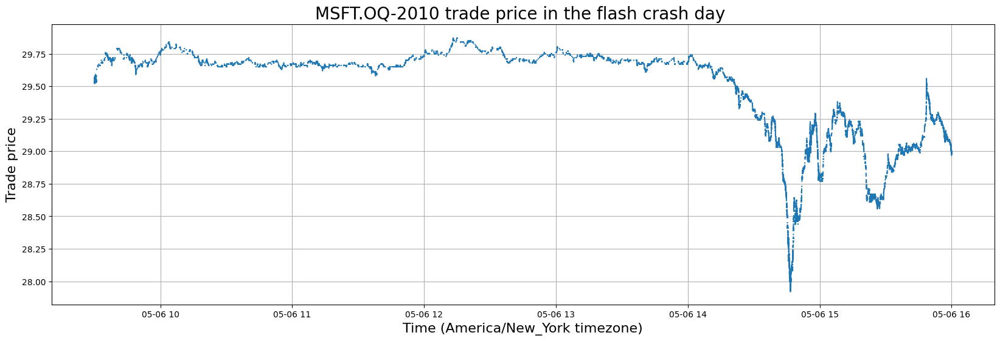

In [175]:
#Trade Price
plotYvsX(ny_index , filtered_df['trade_price'].values,
                'Time (America/New_York timezone)','Trade price',
                f'{ticker_name} trade price in the flash crash day ',plots_dir)

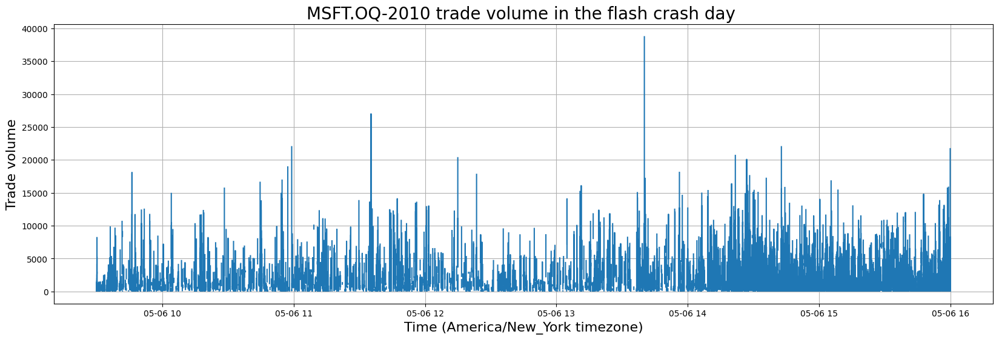

In [176]:
#Trade volume
plotYvsX(ny_index, filtered_df['trade_volume'].values,
                'Time (America/New_York timezone)','Trade volume',
                f'{ticker_name} trade volume in the flash crash day ',plots_dir)

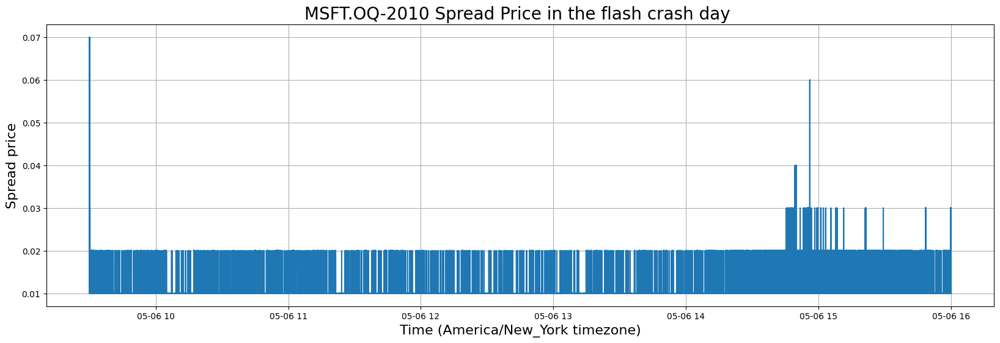

In [177]:
#### Spread
plotYvsX(ny_index,
                np.array(filtered_df['ask-price'].values)- np.array(filtered_df['bid-price'].values),
                'Time (America/New_York timezone)','Spread price',
                f'{ticker_name} Spread Price in the flash crash day ',plots_dir)

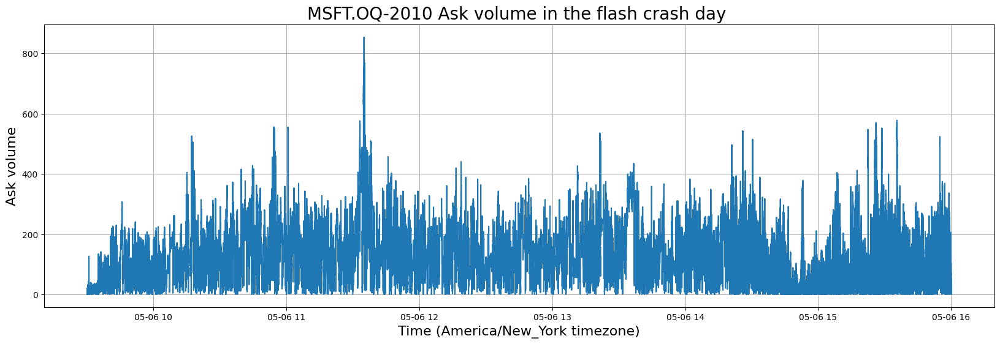

In [178]:
#Ask volume
plotYvsX(ny_index, filtered_df['ask-volume'].values,
                'Time (America/New_York timezone)','Ask volume',
                f'{ticker_name} Ask volume in the flash crash day ',plots_dir)

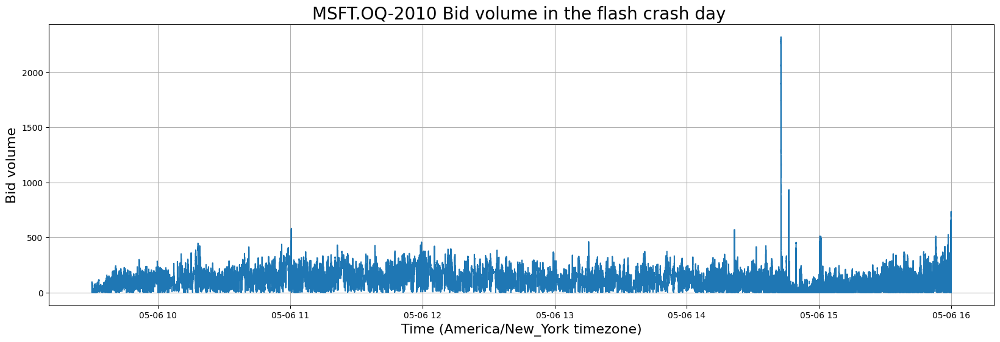

In [179]:
### Bid volume 
plotYvsX(ny_index, filtered_df['bid-volume'].values,
                'Time (America/New_York timezone)','Bid volume',
                f'{ticker_name} Bid volume in the flash crash day ',plots_dir)

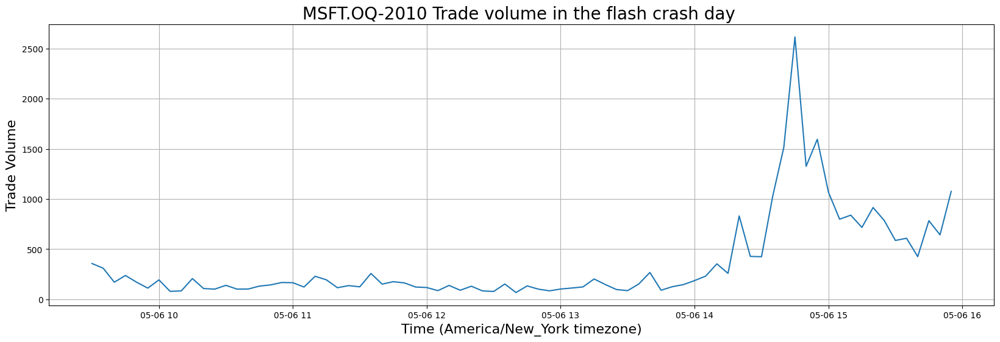

In [180]:
# Number of trades  per 5 min during the day of the Crash 
df_crash = filtered_df.copy()
df_crash = df_crash.to_pandas_df()
df_crash['ny_index'] = ny_index 
df_crash.set_index('ny_index',drop=True,inplace=True)
trade_counts = df_crash['trade_volume'].notna().resample('5T').sum()
plotYvsX(trade_counts.index, trade_counts , 'Time (America/New_York timezone)','Trade Volume',
                f'{ticker_name} Trade volume in the flash crash day ',plots_dir)


#### 2) Trade classification: Using Lee-Ready algo

In [181]:
# Define a function to apply the Lee-Ready logic for each row
def classify_trade(row):
    if pd.isna(row['trade_price']):
        return np.nan
    previous_mid_price = row['prev_mid_price']
    
    if row['trade_price'] > previous_mid_price:
        return 1  ## Buyer side 
    elif row['trade_price'] < previous_mid_price:
        return -1 ## Seller side 
    else:
        if row['trade_price'] > row['prev_trade']:
            return 1 
        else :
            return -1

In [182]:
# Fill the missing values in the bid and ask price 
df_crash.loc[:, ['bid-price','ask-price']] = df_crash[['bid-price','ask-price']].ffill()
# Compute the mid price
df_crash['mid_price'] = (df_crash['ask-price'] + df_crash['bid-price']) / 2
df_crash['prev_mid_price']  = df_crash['mid_price'].shift(1)
df_crash['prev_trade']= df_crash['trade_price'].shift(1)
df_crash['trade_class'] = np.nan
# Apply the function to each row
df_crash['trade_class'] = df_crash.apply(classify_trade, axis=1)
df_crash

,trade_price,trade_volume,bid-price,bid-volume,ask-price,ask-volume,index,mid_price,prev_mid_price,prev_trade,trade_class
ny_index,,,,,,,,,,,
2010-05-06 09:30:00.004000-04:00,NaN,NaN,29.57,92.0,29.61,4.0,2010-05-06 13:30:00.004000000,29.590,NaN,NaN,NaN
2010-05-06 09:30:00.047999488-04:00,NaN,NaN,29.61,1.0,29.63,1.0,2010-05-06 13:30:00.047999488,29.620,29.590,NaN,NaN
2010-05-06 09:30:00.092000-04:00,NaN,NaN,29.60,9.0,29.63,2.0,2010-05-06 13:30:00.092000000,29.615,29.620,NaN,NaN
2010-05-06 09:30:00.097999872-04:00,NaN,NaN,29.61,2.0,29.63,2.0,2010-05-06 13:30:00.097999872,29.620,29.615,NaN,NaN
2010-05-06 09:30:00.119000064-04:00,NaN,NaN,29.61,2.0,29.62,2.0,2010-05-06 13:30:00.119000064,29.615,29.620,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2010-05-06 15:59:59.860000256-04:00,28.97,692.0,28.97,92.0,28.98,105.0,2010-05-06 19:59:59.860000256,28.975,28.975,28.97,-1.0
2010-05-06 15:59:59.966000128-04:00,NaN,NaN,28.97,396.0,28.99,2.0,2010-05-06 19:59:59.966000128,28.980,28.975,28.97,NaN
2010-05-06 15:59:59.978000128-04:00,28.98,10500.0,28.97,406.0,28.99,2.0,2010-05-06 19:59:59.978000128,28.980,28.980,NaN,1.0


In [183]:
df_crash.groupby('trade_class').count()

,trade_price,trade_volume,bid-price,bid-volume,ask-price,ask-volume,index,mid_price,prev_mid_price,prev_trade
trade_class,,,,,,,,,,
-1.0,15893,15893,15893,12541,15893,12541,15893,15893,15893,5228
1.0,11969,11969,11969,9386,11969,9386,11969,11969,11969,3970


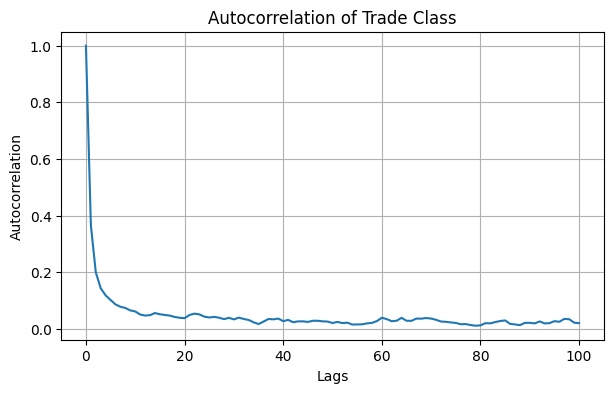

In [184]:
# Assuming 'trade_class' is the column for autocorrelation analysis
# First, let's clean the data by dropping NaN values as autocorrelation
# requires non-null values
df_clean = df_crash.dropna(subset=['trade_class'])

# Check if there's enough data for autocorrelation analysis
if len(df_clean) < 2:
    print("Not enough data for autocorrelation analysis.")
else:
    # Calculate and plot autocorrelation for 'trade_class'
    acf_result = sm.tsa.acf(df_clean['trade_class'], nlags=100, fft=True)

    plt.figure(figsize=(7, 4))
    plt.plot(acf_result)
    plt.xlabel('Lags')
    plt.ylabel('Autocorrelation')
    plt.title('Autocorrelation of Trade Class')
    plt.grid(True)
    plt.show()


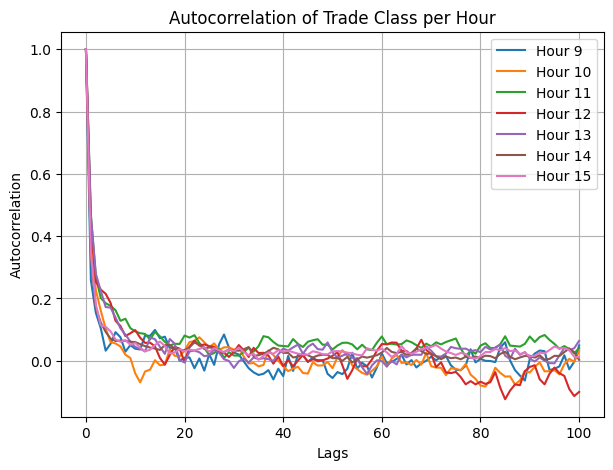

In [188]:
df_crash['hour'] = df_crash.index.hour
plt.figure(figsize=(7, 5))

# Group the DataFrame by hour and compute autocorrelation for each group
for hour in df_crash['hour'].unique():
    df_hour = df_crash[df_crash['hour'] == hour]
    df_hour_clean = df_hour.dropna(subset=['trade_class'])
    
    if len(df_hour_clean) > 10:  # Check if there's enough data for autocorrelation analysis
        acf_result = sm.tsa.acf(df_hour_clean['trade_class'], nlags=100, fft=True)
        # Plot the autocorrelation
        plt.plot(acf_result, label=f'Hour {hour}')
    else:
        print(f"Not enough data for autocorrelation analysis for hour {hour}.")
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.title(f'Autocorrelation of Trade Class per Hour')
plt.legend()
plt.grid()
plt.show()

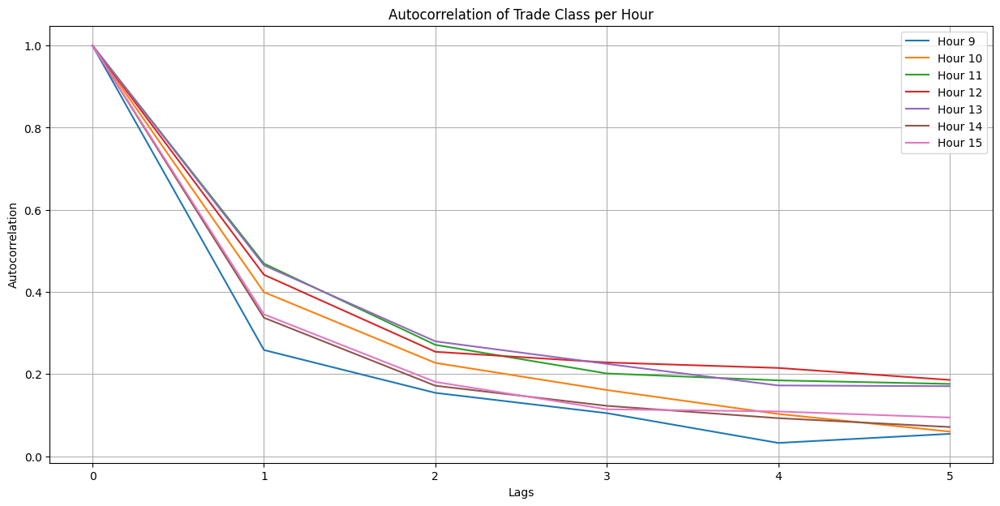

In [216]:
df_crash['hour'] = df_crash.index.hour
plt.figure(figsize=(15, 7))

# Group the DataFrame by hour and compute autocorrelation for each group
for hour in df_crash['hour'].unique():
    df_hour = df_crash[df_crash['hour'] == hour]
    df_hour_clean = df_hour.dropna(subset=['trade_class'])
    
    if len(df_hour_clean) > 10:  # Check if there's enough data for autocorrelation analysis
        acf_result = sm.tsa.acf(df_hour_clean['trade_class'], nlags=5, fft=True)
        # Plot the autocorrelation
        plt.plot(acf_result, label=f'Hour {hour}')
    else:
        print(f"Not enough data for autocorrelation analysis for hour {hour}.")
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.title(f'Autocorrelation of Trade Class per Hour')
plt.legend()
plt.grid()
plt.show()

#### Discussion : 
We can see that the trades in middle of the day are more predictable. Specifically, trades between 11h and 13h have autocorellation of 0.2 even after 5 lags.

In [78]:
#### Prediction of the trade class using auto correlation
#TODO
# use GARCH


### 3) Response Function

In [487]:
def setup_response_function_data(df):
    """ Setup the data for the response function analysis. 
    If not found,Compute the mid-price, previous mid-price,pervious trade price and the trade class.
    """
    assert 'index' in df.columns, "The index column is missing"
    assert 'ask-price' in df.columns, "The ask-price column is missing"
    assert 'bid-price' in df.columns, "The bid-price column is missing"
    assert 'trade_price' in df.columns, "The trade_price column is missing"
    if not isinstance(df, pd.DataFrame): df = df.to_pandas_df()
    # Convert the index to New York timezone
    ny_index = pd.DatetimeIndex(df['index'])
    ny_index = ny_index.tz_localize('UTC').tz_convert('America/New_York')
    df['index'] = ny_index
    df.set_index('index',inplace=True)
    # Fill the missing values in the bid and ask price
    df.loc[:, ['bid-price','ask-price']] = df[['bid-price','ask-price']].ffill()
    # Compute the mid price
    if 'mid_price' not in df.columns: df['mid_price'] = (df['ask-price'] + df['bid-price']) / 2
    if 'prev_mid_price' not in df.columns:  df['prev_mid_price']  = df['mid_price'].shift(1)
    if 'prev_trade' not in df.columns: df['prev_trade']= df['trade_price'].shift(1)
    if 'trade_class' not in df.columns: 
        df['trade_class'] = np.nan
        # Apply the function to each row
        df['trade_class'] = df.apply(classify_trade, axis=1)
    return df

def compute_response(df, tau_max=100):
    R = []
    R_std = []
    for tau in range(1, tau_max):
        # Now, compute the mid-price at time t + tau
        mid_price_tau = df['mid_price'].shift(-tau)
        # Compute the weighted price difference for each trade
        r_values = df['trade_class'] * ((mid_price_tau - df['mid_price']))
        # Compute the average response function R(tau)
        R.append(r_values.mean())
        R_std.append(r_values.std())
    return R,R_std

def plot_response(R,ticker_name='',confidence_interval=False):
    R, R_std = R
    plt.figure(figsize=(7, 4))
    plt.plot(R)
    if confidence_interval:
        plt.fill_between(range(len(R)), np.array(R) - np.array(R_std), np.array(R) + np.array(R_std), alpha=0.2)
    plt.xlabel('Lags')
    plt.ylabel('Response function')
    plt.title(ticker_name + ' Average response function' )
    plt.grid(True)
    plt.show()



def plot_response_function(df, tau_max =1000, ticker = "",confidence_interval=False):
    # Define tau, for example, 5 minutes if your timestamps are in seconds
    df = setup_response_function_data(df)
    # Compute the average response function R(tau)
    R = compute_response(df, tau_max)
    plot_response(R,ticker_name=ticker,confidence_interval=confidence_interval)

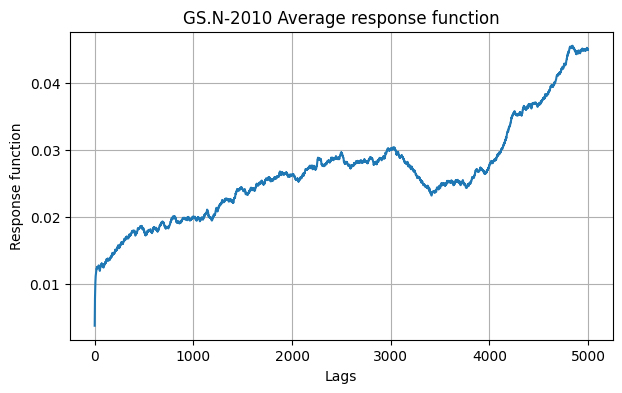

In [526]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000
df = df[(df['index'] >= "2010-05-06") & (df['index'] <= "2010-05-07")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name) #Crash day

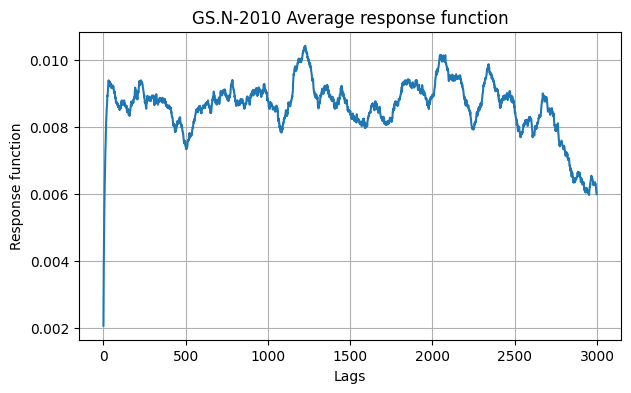

In [490]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 3000
df = df[(df['index'] >= "2010-05-10") & (df['index'] <= "2010-05-12")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name) #Normal day

#### Discussion :
We can clearly see a pattern where during a normal day the response function is more stable wheras during a crash day, there is no maximum and it increases indefinetly. For further investigation, let's look at the standard deviation of these response functions.

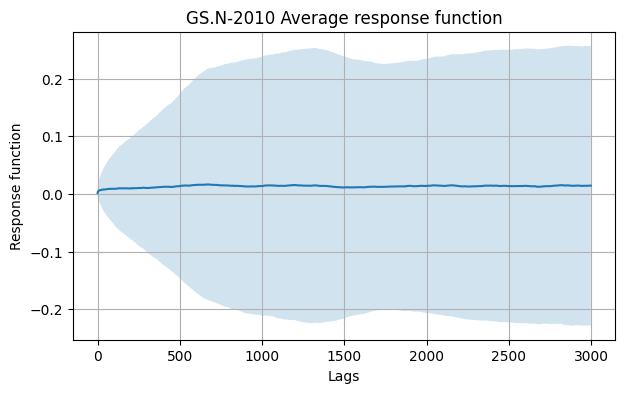

In [510]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 3000
df = df[(df['index'] >= "2010-03-01") & (df['index'] <= "2010-03-02")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name,confidence_interval=True) #Normal day

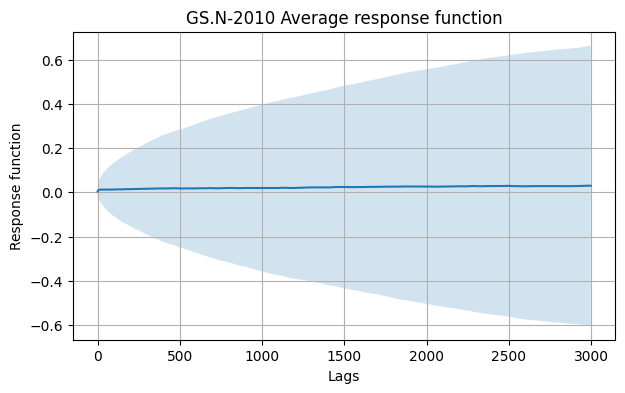

In [492]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 3000
df = df[(df['index'] >= "2010-05-06") & (df['index'] <= "2010-05-07")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name,confidence_interval=True) #Crash day

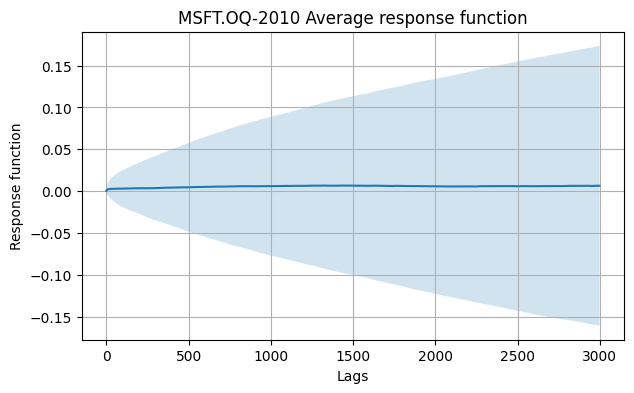

In [508]:
ticker_name =  ticker_list[6]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 3000
df = df[(df['index'] >= "2010-05-06") & (df['index'] <= "2010-05-07")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name,confidence_interval=True) #Crash day

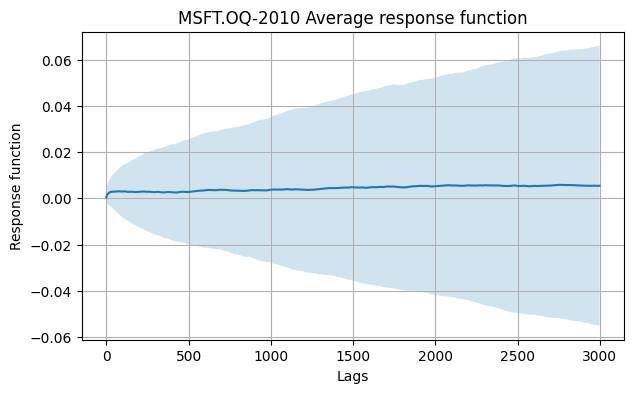

In [509]:
ticker_name =  ticker_list[6]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 3000
df = df[(df['index'] >= "2010-03-01") & (df['index'] <= "2010-03-02")]
plot_response_function(df, tau_max =tau_max, ticker = ticker_name,confidence_interval=True) # Crash day

#### Discussion : 
We can see that the volatility of the response is significantly larger during the crash day in both GS and MSFT tickers.

In [496]:
def plot_3day_response_functions(df, tau_max =1000, ticker = "",start_date='2010-05-05'):
    end_date = pd.to_datetime(start_date) + pd.DateOffset(days=3)
    end_date = end_date.strftime('%Y-%m-%d')
    df_filtered = df.copy()
    # df_filtered = df_filtered[(df_filtered['index'] >= start_date) & (df_filtered['index'] <= end_date)]
    df_filtered = df_filtered[(df_filtered.index >= start_date) & (df_filtered.index <= end_date)]
    df_filtered = setup_response_function_data(df_filtered)
    _,ax = plt.subplots(1, 3, figsize=(20, 6))
    for i in range(3):
        start = pd.to_datetime(start_date) + pd.DateOffset(days=i)
        end = pd.to_datetime(start) + pd.DateOffset(days=1)
        start = start.strftime('%Y-%m-%d')
        end = end.strftime('%Y-%m-%d')
        df_day = df_filtered.copy()
        # df_day = df_day[(df_day['index'] >= start) & (df_day['index'] <= end)]
        df_day = df_day[(df_day.index >= start) & (df_day.index <= end)]
        R,R_std = compute_response(df_day, tau_max)
        ax[i].plot(R)
        ax[i].set_xlabel('Tau')
        ax[i].set_ylabel('R(tau)')
        ax[i].set_title(ticker + ' Average Response Function' + f' {start}')
        ax[i].grid()
    plt.tight_layout()
    plt.show()

In [497]:
#We assume that the data for the specific ticker is already cleaned, here is a list of cleaned tickers
ticker_list = os.listdir(loading_dir)
if '.DS_Store' in ticker_list : ticker_list.remove('.DS_Store')
ticker_list

['GS.N-2010',
 'AAPL.OQ-2010',
 'HD.N-2010',
 'DOW.N-2010',
 'PG.N-2010',
 'NKE.N-2010',
 'MSFT.OQ-2010',
 'AMGN.OQ-2010']

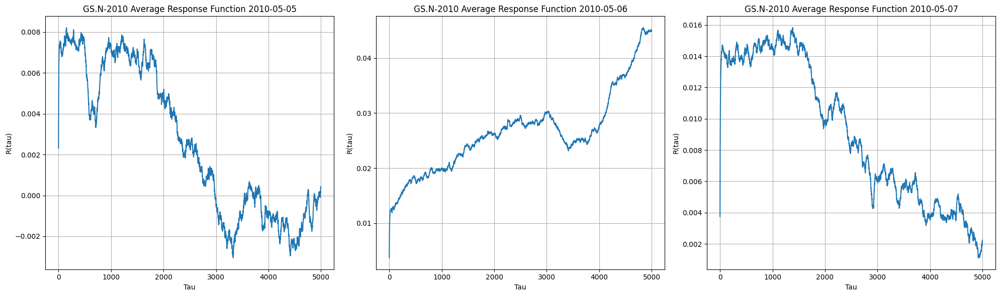

In [498]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

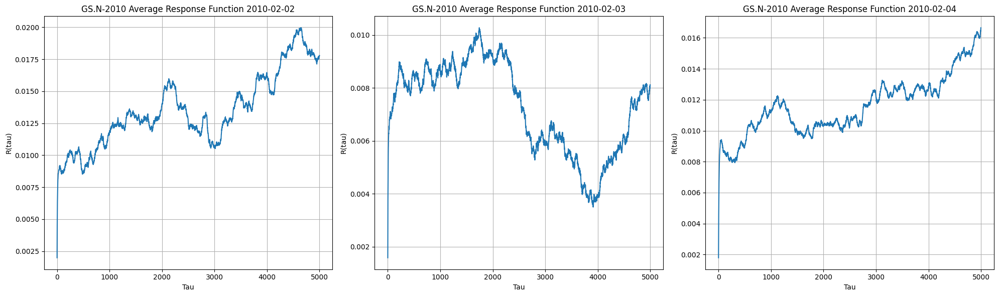

In [372]:
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-02') #normal day

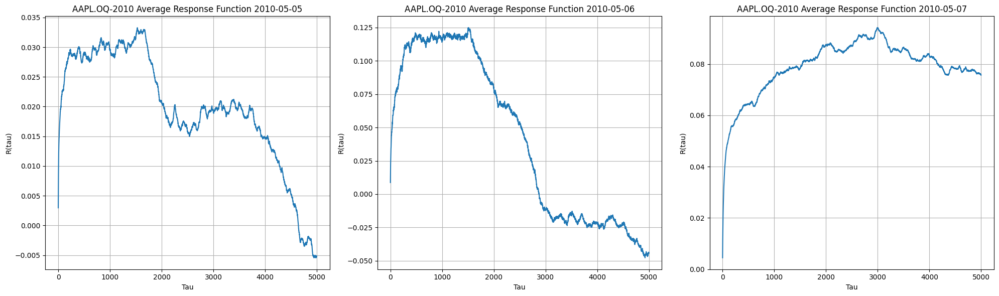

In [240]:
ticker_name =   ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

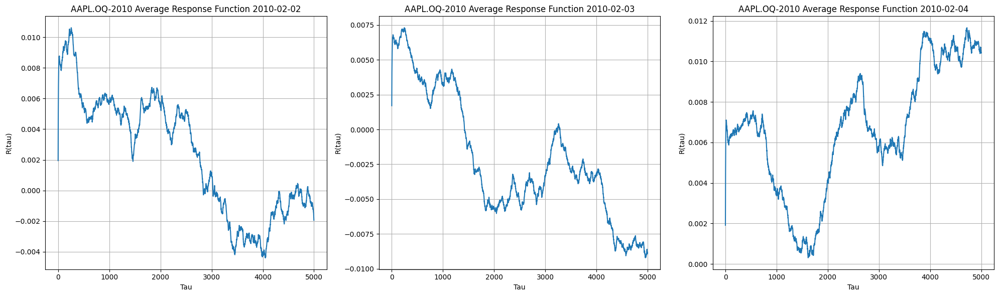

In [241]:
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-02') #normal day

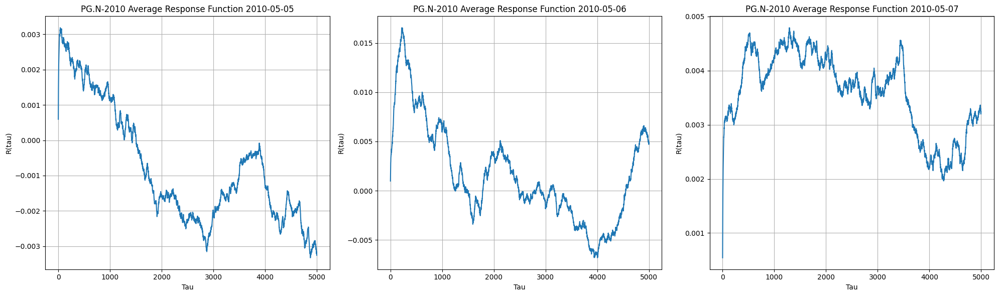

In [252]:
ticker_name = 'PG.N-2010'
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

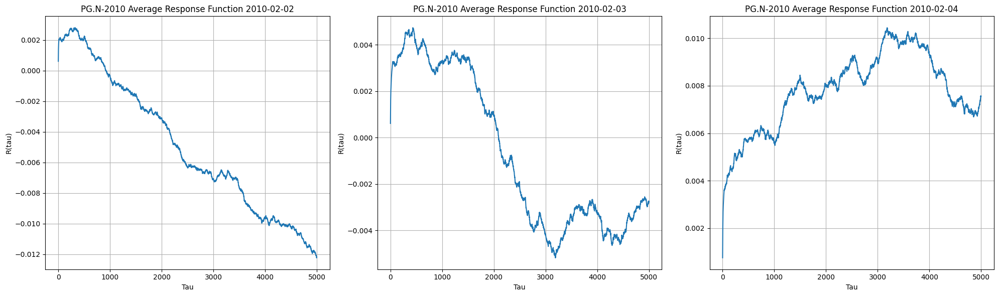

In [253]:
plot_3day_response_functions(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-02') #Crash day

Discussion: We notice important trends in crash days as opposed to normal days:
- Spread always very big (max - min is magnitudes higher than normal) (always valid)
- Min or Max not bounded (depends on the ticker: valid for Goldman Sachs and Apple but not for Proctor&Gamble)

#### a) Buy - Sell Response Function

In [374]:
def plot_3day_response_functions_split(df, tau_max =1000, ticker = "",start_date='2010-05-05'):
    end_date = pd.to_datetime(start_date) + pd.DateOffset(days=3)
    end_date = end_date.strftime('%Y-%m-%d')
    df_filtered = df.copy()
    # df_filtered = df_filtered[(df_filtered['index'] >= start_date) & (df_filtered['index'] <= end_date)]
    df_filtered = df_filtered[(df_filtered.index >= start_date) & (df_filtered.index <= end_date)]
    df_filtered = setup_response_function_data(df_filtered)
    fig,ax = plt.subplots(1, 3, figsize=(22, 8))
    for i in range(3):
        start = pd.to_datetime(start_date) + pd.DateOffset(days=i)
        end = pd.to_datetime(start) + pd.DateOffset(days=1)
        start = start.strftime('%Y-%m-%d')
        end = end.strftime('%Y-%m-%d')
        
        df_day = df_filtered.copy()
        df_day = df_day[(df_day.index >= start) & (df_day.index <= end)]

        # Group the DataFrame by hour and compute autocorrelation for each group
        for trade_class in df_day['trade_class'].unique():
            df_hour = df_day[df_day['trade_class'] == trade_class]
            df_hour_clean = df_hour.dropna(subset=['trade_class'])
            R = compute_response(df_hour_clean, tau_max)
            ax[i].plot(R, label=f'Trade Class {trade_class}')
        ax[i].legend()
        ax[i].set_xlabel('Tau')
        ax[i].set_ylabel('R(tau)')
        ax[i].set_title(ticker_name + ' Average Response Function' + f' {start}')
        ax[i].grid()
    plt.tight_layout()
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


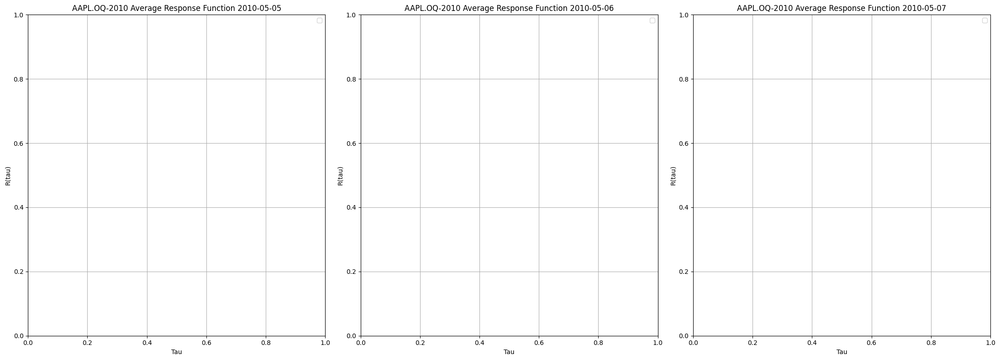

In [528]:
ticker_name =   ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000

plot_3day_response_functions_split(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


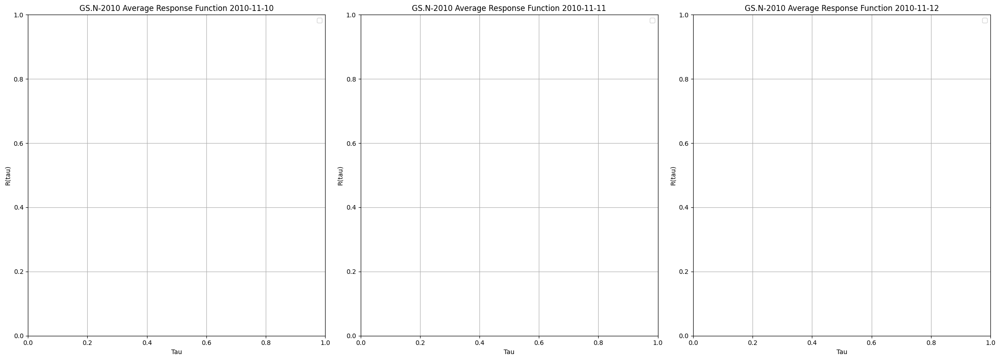

In [527]:
plot_3day_response_functions_split(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-11-11') #normal day

#### b) By Hour

In [499]:
def plot_3day_response_functions_hourly(df, tau_max =1000, ticker = "",start_date='2010-05-05'):
    end_date = pd.to_datetime(start_date) + pd.DateOffset(days=3)
    end_date = end_date.strftime('%Y-%m-%d')
    df_filtered = df.copy()
    df_filtered = df_filtered[(df_filtered.index >= start_date) & (df_filtered.index <= end_date)]
    
    df_filtered = setup_response_function_data(df_filtered)
    fig,ax = plt.subplots(1, 3, figsize=(22, 8))
    for i in range(3):
        start = pd.to_datetime(start_date,utc=True) + pd.DateOffset(days=i)
        end = pd.to_datetime(start,utc=True) + pd.DateOffset(days=1)
        start = start.strftime('%Y-%m-%d')
        end = end.strftime('%Y-%m-%d')
        
        df_day = df_filtered.copy()
        df_day = df_day[(df_day.index >= start) & (df_day.index <= end)]
        
        df_day['hour'] = pd.DatetimeIndex(df_day.index).hour

        # Group the DataFrame by hour and compute autocorrelation for each group
        for hour in df_day['hour'].unique():
            df_hour = df_day[df_day['hour'] == hour]
            df_hour_clean = df_hour.dropna(subset=['trade_class'])
            # Compute the average response function R(tau)
            R ,R_std = compute_response(df_hour_clean, tau_max)
            ax[i].plot(R, label=f'Hour {hour}')
        ax[i].legend()
        ax[i].set_xlabel('Tau')
        ax[i].set_ylabel('R(tau)')
        ax[i].set_title(ticker_name + ' Average Response Function' + f' {start}')
        ax[i].grid()
    plt.tight_layout()
    plt.show()


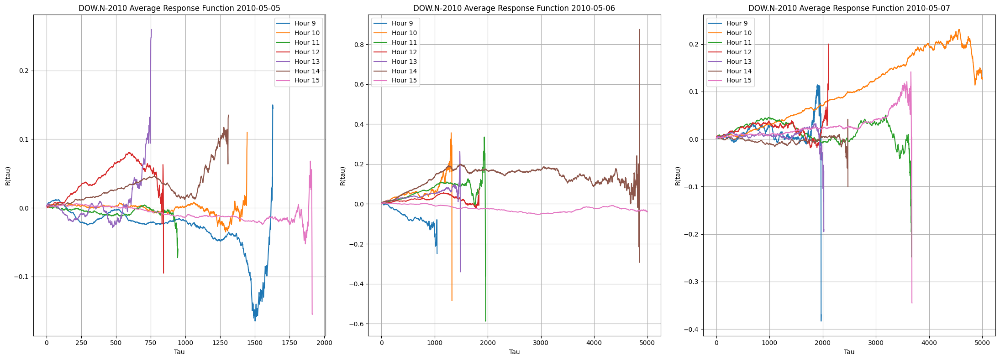

In [378]:
ticker_name =   ticker_list[3]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000

plot_3day_response_functions_hourly(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

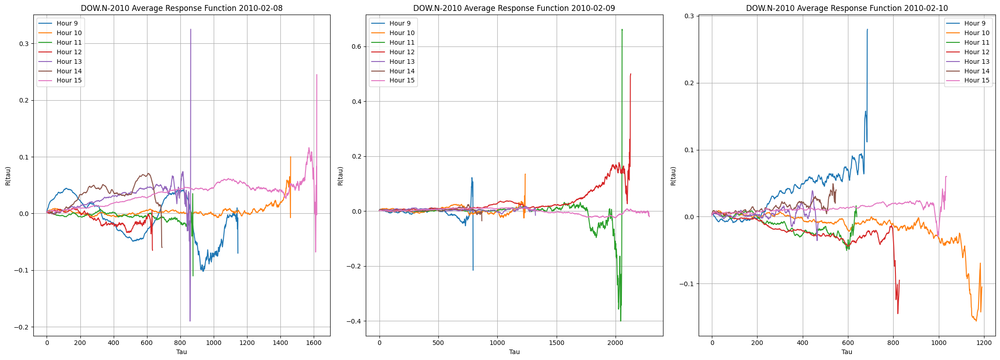

In [379]:
plot_3day_response_functions_hourly(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-08') #Normal day

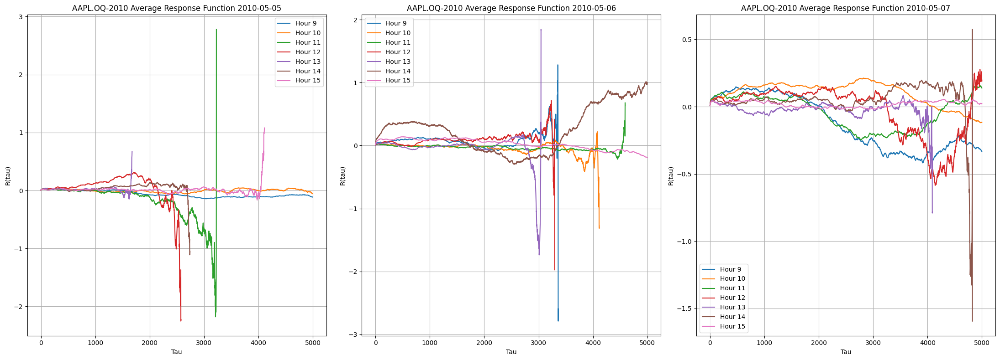

In [380]:
ticker_name =   ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000

plot_3day_response_functions_hourly(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05') #Crash day

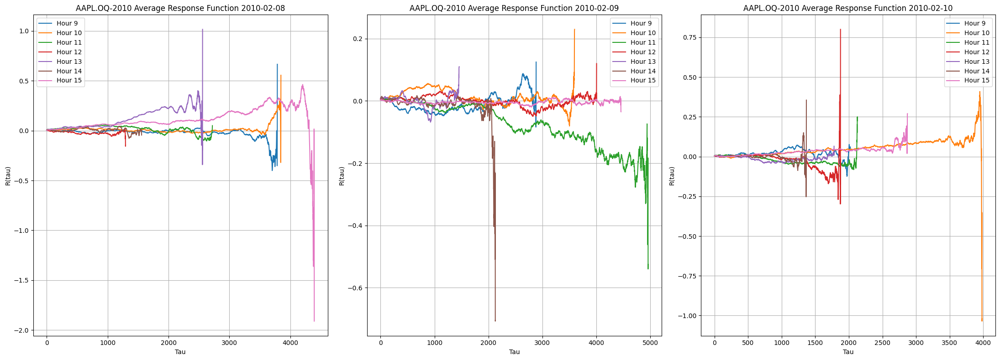

In [381]:
plot_3day_response_functions_hourly(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-08') #Normal day

#### c) By 15 minute intervals

In [390]:
def plot_3day_response_functions_15min(df, tau_max=1000, ticker="", start_date='2010-05-05'):
    end_date = pd.to_datetime(start_date) + pd.DateOffset(days=3)
    end_date = end_date.strftime('%Y-%m-%d')
    df_filtered = df.copy()
    df_filtered = df_filtered[(df_filtered.index >= start_date) & (df_filtered.index <= end_date)]
    
    df_filtered = setup_response_function_data(df_filtered)
    fig, axs = plt.subplots(3, figsize=(22, 18))  # Changed to vertical subplots for clarity
    
    for i in range(3):
        start = pd.to_datetime(start_date).tz_localize('America/New_York') + pd.DateOffset(days=i)
        end = start + pd.DateOffset(days=1)
        df_day = df_filtered[(df_filtered.index >= start) & (df_filtered.index < end)]  # Use '< end' to not include the end
        
        # Group the DataFrame by 15-minute intervals
        df_day_grouped = df_day.groupby(pd.Grouper( freq='15T'))
        # df_day_grouped = df_day.groupby(pd.Grouper(key='index', freq='15T'))
        
        for name, group in df_day_grouped:
            if not group.empty:
                group_clean = group.dropna(subset=['trade_class'])
                # Compute the average response function R(tau) for the group
                R,R_std = compute_response(group_clean, tau_max)
                axs[i].plot(R, label=name.strftime('%H:%M'))  # Label with the start of the 15-min interval
        
        axs[i].legend()
        axs[i].set_xlabel('Tau')
        axs[i].set_ylabel('R(tau)')
        axs[i].set_title(f'{ticker} Response Function {start.date()}')
        axs[i].grid()
    
    plt.tight_layout()
    plt.show()

In [399]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import pandas as pd

def plot_3day_response_functions_15min(df, tau_max=1000, ticker="", start_date='2010-05-05'):
    end_date = pd.to_datetime(start_date) + pd.DateOffset(days=3)
    end_date = end_date.strftime('%Y-%m-%d')
    df_filtered = df.copy()
    df_filtered = df_filtered[(df_filtered.index >= start_date) & (df_filtered.index <= end_date)]
    
    df_filtered = setup_response_function_data(df_filtered)
    # Create a Plotly subplot figure with 3 rows and 1 column
    fig = make_subplots(rows=3, cols=1, subplot_titles=[f'{ticker} Response Function {(pd.to_datetime(start_date) + pd.DateOffset(days=i))}' for i in range(3)])
    
    for i in range(3):
        start = pd.to_datetime(start_date).tz_localize('America/New_York') + pd.DateOffset(days=i)
        end = start + pd.DateOffset(days=1)
        df_day = df_filtered[(df_filtered.index >= start) & (df_filtered.index < end)]
        
        # Group the DataFrame by 15-minute intervals
        df_day_grouped = df_day.groupby(pd.Grouper(freq='15T'))
        
        for name, group in df_day_grouped:
            if not group.empty:
                group_clean = group.dropna(subset=['trade_class'])
                # Compute the average response function R(tau) for the group
                R ,R_std = compute_response(group_clean, tau_max)
                # Create a scatter plot for each group and add it to the corresponding subplot
                fig.add_trace(go.Scatter(x=list(range(len(R))), y=R, mode='lines', name=name.strftime('%H:%M')), row=i+1, col=1)
        
        # Update x-axis and y-axis labels
        fig.update_xaxes(title_text='Tau', row=i+1, col=1)
        fig.update_yaxes(title_text='R(tau)', row=i+1, col=1)

    # Update layout and show the figure
    fig.update_layout(height=600, width=1200, title_text=f'{ticker} Response Functions', showlegend=True)
    fig.show()

In [400]:
ticker_name =   ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 1000

plot_3day_response_functions_15min(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05')

In [405]:
ticker_name =   ticker_list[4]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 1000

plot_3day_response_functions_15min(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-05-05')

In [406]:
plot_3day_response_functions_15min(df, tau_max =tau_max, ticker = ticker_name,start_date='2010-02-10')

#### d) Market Response as a function of volume trade

In [520]:
def compute_response_volume(df, tau=1):
    R = []
    df.dropna(subset=['trade_volume'], inplace=True)
    df.dropna(subset=['mid_price'], inplace=True)
    for volume in df.trade_volume.unique():
        # Now, compute the mid-price at time t + tau
        df_volume = df[df.trade_volume == volume]
        # df_volume = df_volume[df_volume['trade_class']==1]
        mid_price_tau = df_volume['mid_price'].shift(-tau)
        # Compute the weighted price difference for each trade
        r_values = df_volume['trade_class'] * ((mid_price_tau - df_volume['mid_price']))
        # Compute the average response function R(tau)
        R_tau = r_values.mean()
        R.append((volume,R_tau))
    return R

Text(0.5, 1.0, 'AAPL.OQ-2010 Average response function R(1,V)')

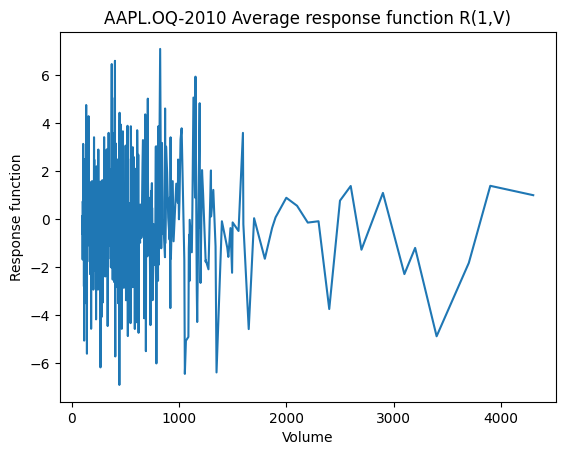

In [525]:
ticker_name =  ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))

df = df[(df['index'] >= "2010-05-05") & (df['index'] <= "2010-05-06")] #Normal day
df = setup_response_function_data(df)
tau = 1
R = compute_response_volume(df, tau=tau)
R = sorted(R, key=lambda x: x[0])
R = [(volume, R_tau) for volume, R_tau in R if not np.isnan(R_tau)]
x = [i[0] for i in R]
y = [i[1] for i in R]
plt.plot(x, y)
plt.xlabel('Volume')
plt.ylabel('Response function')
plt.title(ticker_name + f' Average response function R({tau},V)')

Text(0.5, 1.0, 'AAPL.OQ-2010 Average response function R(1,V)')

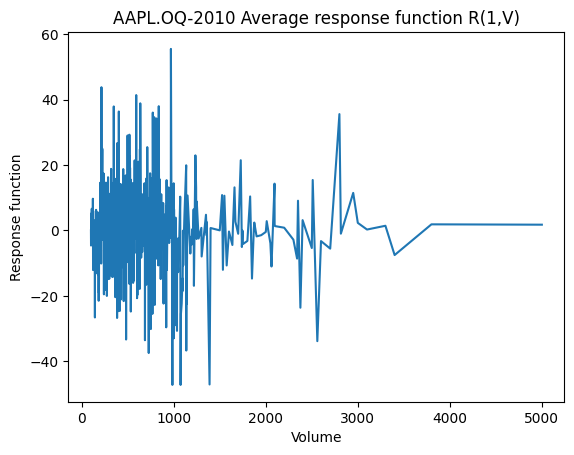

In [524]:
ticker_name =  ticker_list[1]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))

df = df[(df['index'] >= "2010-05-06") & (df['index'] <= "2010-05-07")] #Crash day
df = setup_response_function_data(df)
tau = 1
R = compute_response_volume(df, tau=tau)
R = sorted(R, key=lambda x: x[0])
R = [(volume, R_tau) for volume, R_tau in R if not np.isnan(R_tau)]
x = [i[0] for i in R]
y = [i[1] for i in R]
plt.plot(x, y)
plt.xlabel('Volume')
plt.ylabel('Response function')
plt.title(ticker_name + f' Average response function R({tau},V)')

Discussion : 
Even though there is no clear pattern, we can notice the huge difference in magnitude between the normal day and the crash day.

#### e) ECDF of Response Function

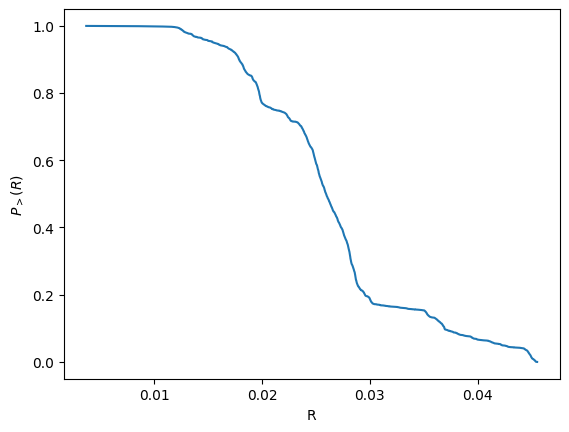

In [501]:
ticker_name =  ticker_list[0]
loading_dir = os.path.join(current_dir,"data","clean", "flash_crash")
plots_dir = os.path.join(current_dir,"plots","flash_crash",ticker_name)
file_dir = os.path.join(loading_dir,ticker_name)
file_name = os.listdir(file_dir)[0]
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000

df = df[(df['index'] >= "2010-05-06") & (df['index'] <= "2010-05-07")]
df = setup_response_function_data(df)
R,_ = compute_response(df, tau_max)

x=R
ecdf_r=ECDF(x)
plt.plot(ecdf_r.x,1-ecdf_r.y)
plt.xlabel("R")
plt.ylabel("$P_>(R)$")
plt.show()

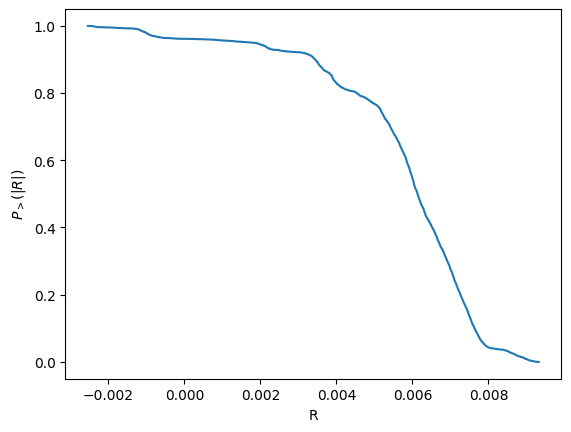

In [503]:
df = vaex.open(os.path.join(file_dir,file_name))
tau_max = 5000

df = df[(df['index'] >= "2010-05-10") & (df['index'] <= "2010-05-11")]
df = setup_response_function_data(df)
R,_ = compute_response(df, tau_max)
x=R
ecdf_r=ECDF(x)
plt.plot(ecdf_r.x,1-ecdf_r.y)
plt.xlabel("R")
plt.ylabel("$P_>(R)$")
plt.show()

#### Discussion :
The plot of ECDF further demonstrates the signifance of the response function magnitude during a crash day.

#### Conclusion :
From the previous data analysis, we established some trends in market response functions that we will use later on to predict a flash crash. 